# Машинное обучение, РЭШ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 05.11.2022

Дедлайн: 17:00MSK 17.11.2022

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются на my.nes в виде Jupyter-notebook файла.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [1]:
# !pip install folium

In [2]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

In [4]:
import warnings
warnings.filterwarnings("ignore")

## Часть 0. Подготовка (1 балл)

**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [5]:
df = pd.read_csv('./train.csv')

Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [6]:
df.drop(columns=['dropoff_datetime'], inplace=True)
df.pickup_datetime = df.pickup_datetime.astype('datetime64')

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

<AxesSubplot: xlabel='trip_duration', ylabel='Count'>

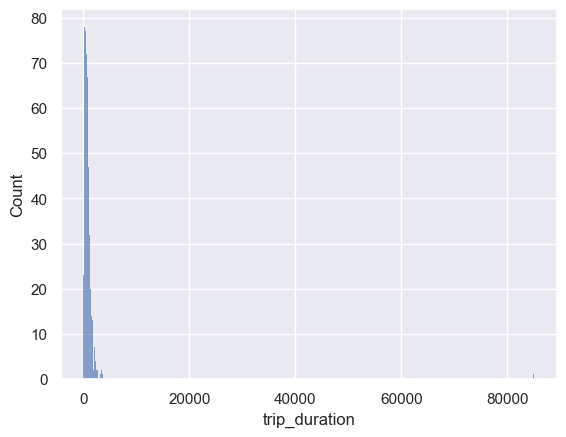

In [7]:
sns.histplot(df.trip_duration.sample(500))

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

**Ответ**: В целом целевая значения целевой переменной сконцентрированы в районе 800 - 1000. При этом имеются значительные выбросы. Возможно при таком распределении стоит лоагрифмировать целевую переменную, что и будет сделано дальше

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

**Ответ**: В целом RMSLE хорошо подходит для задач с неотрицательный целевой переменной и неотрицательными прогнозами модели. Также, так как мы логарифмируем прогнозы и ответы, то штраф идет не за отклонения в значениях, а за отклонения в порядке величин. Это можно увидеть, переписав выражение в скобках:

$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{\frac{y_i + 1}{a(x_i) + 1}}\big)^2}$$

Видно, что штраф будет большим, если истинное значение на несколько порядков больше предсказания. Но вот раница в несколько единиц не будет штрафоваться так сильно. Кроме того, из такого представления формулы видано, что за заниженные прогнозы штраф будет больше, чем за завышенные в силу несиметричности лог функции. Возможно это имеет смысл в задаче предсказания длинны поездки. Мы не хотим ошибаться в меньшую сторону. Ну и наконец, целевая переменная имеет распределение похожее на лог-нормальное. Если его прологарифмировать, то получим нормальное распределение, с которым значительно проще работать в силу его свойств.

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: 

Выпишем, RMSLE для задачи оптимизации $a(x_i)$: $\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$

Теперь выпишем RMSE для задачи оптимизации $\hat{a}(x_i)$: $\text{RMSE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(log(y_{i} + 1) - \hat{a}(x_{i})\big)^2}$

Возьмем выражение $a(x_i) = \exp(\hat{a}(x_i)) - 1$, перенесем единицу право, возьмем log от обоих частей и подставим в MSE вместо $\hat{a}(x_{i})$

Получим $\hat{a}(x_i)$: $\text{RMSE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(log(y_{i} + 1) - log(1 + a(x_i))\big)^2}$, что эквивалентно задаче оптимизации RSMLE. QED

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашей выборке колонку `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке. Удалите колонку со старым таргетом.

In [8]:
df['log_trip_duration'] = np.log1p(df['trip_duration']) # создаем новую колонку
df.drop(columns=['trip_duration'], inplace=True) # выкидываем старую колонку

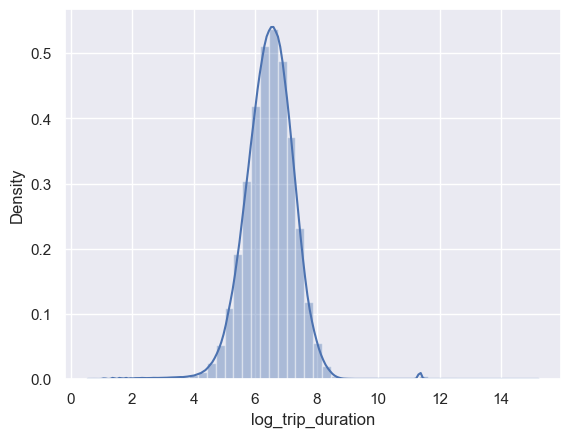

In [9]:
sns.distplot(df.log_trip_duration); # стоим график

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [10]:
from sklearn.metrics import mean_squared_error
best_constant = df.log_trip_duration.mean()
print('Train RMSE with best constant = %.4f' % mean_squared_error(df.log_trip_duration, 
                                                                  best_constant * np.ones(df.log_trip_duration.shape),
                                                                  squared=False))

Train RMSE with best constant = 0.7958


    Выше этого значения RMSE быть не должно, иначе наша модель начинает быть хуже константной

## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

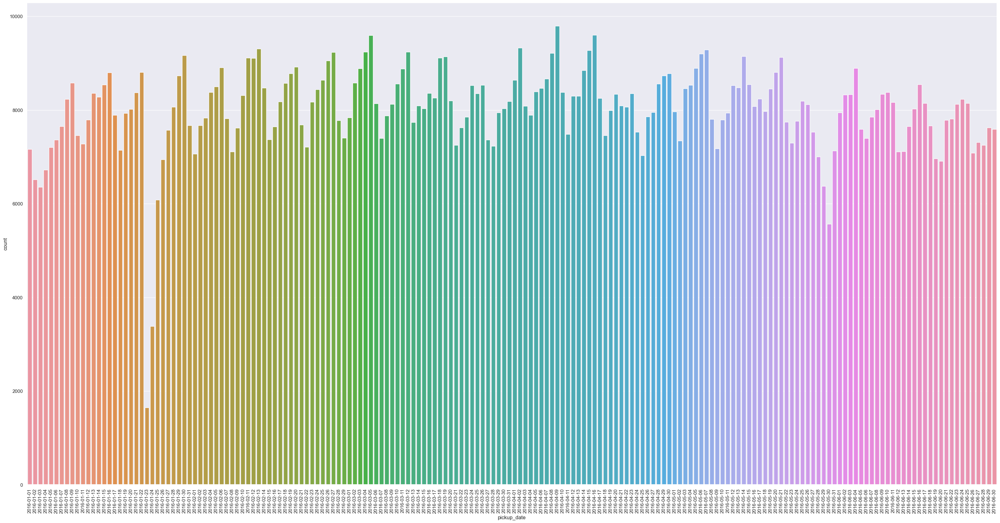

In [11]:
df['pickup_date'] = df['pickup_datetime'].dt.date #leave only days

fig, ax = plt.subplots(figsize=(40,20))
sns.countplot(x=df['pickup_date'].sort_values(ascending=True))
plt.xticks(rotation=90);

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Аномальные дни: 2016-01-23 - аномальный снегопад в NY, а также 2016-05-30 (Что происходило в этот день я найти не смог)

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

In [12]:
# подготовим df, добавив в него месяца, дни недели, часы и дни
df['hour'] = df.pickup_datetime.dt.hour
df['weekday'] = df.pickup_datetime.dt.weekday
df['month'] = df.pickup_datetime.dt.month
df['day'] = df.pickup_datetime.dt.dayofyear

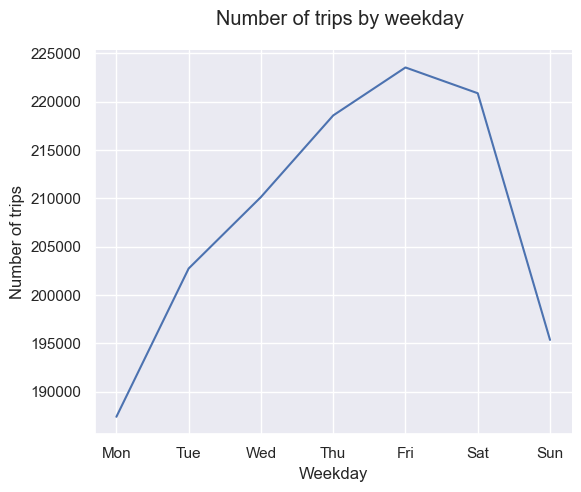

In [13]:
g = sns.relplot(x = 'weekday',
            y = 'id',
            data = df.groupby('weekday', as_index = False).agg({'id': 'count'}),
            kind='line')
g.fig.suptitle('Number of trips by weekday')
g.set_xlabels('Weekday')
g.set_ylabels('Number of trips')


for ax in g.axes.flat:
    ax.set_xticks([0,1,2,3,4,5,6])
    ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

g.fig.subplots_adjust(left = 0.01, top = 0.9)

In [14]:
df.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,log_trip_duration,pickup_date,hour,weekday,month,day
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,6.122493,2016-03-14,17,0,3,74
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,6.498282,2016-06-12,0,6,6,164
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,7.661527,2016-01-19,11,1,1,19
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,6.063785,2016-04-06,19,2,4,97
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,6.077642,2016-03-26,13,5,3,86


**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

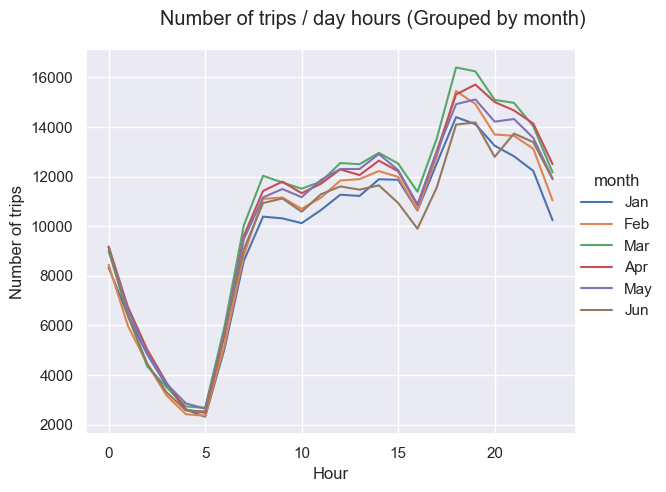

In [15]:
#grouped by month and hour for plotting
montly = df.groupby(['month', 'hour'], as_index=False).agg({'id': 'count'}).rename(columns={'id': 'num_trips'})
months = {
    1: 'Jan',
    2: 'Feb',
    3: 'Mar',
    4: 'Apr',
    5: 'May',
    6: 'Jun'
}
montly['month'] = montly['month'].map(months)
g = sns.relplot(x='hour', y='num_trips', data=montly, hue='month', kind='line')
g.set_xlabels('Hour')
g.set_ylabels('Number of trips')

g.fig.suptitle('Number of trips / day hours (Grouped by month)')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

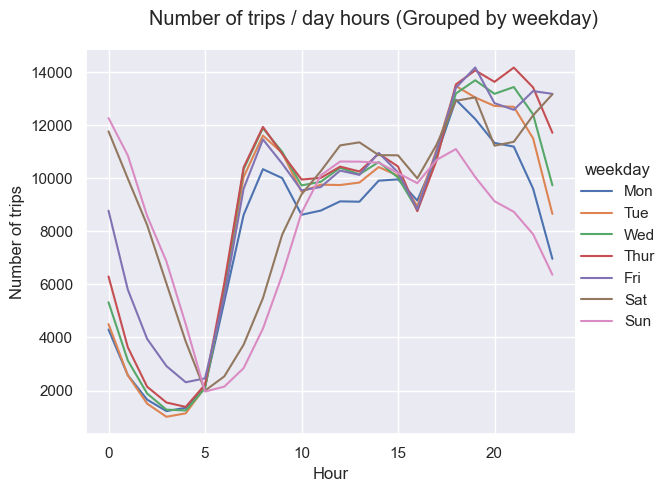

In [16]:
weekly = df.groupby(['weekday', 'hour'], as_index=False).agg({'id': 'count'}).rename(columns={'id': 'num_trips'})

weekdays = {
    0: 'Mon',
    1: 'Tue',
    2: 'Wed',
    3: 'Thur',
    4: 'Fri',
    5: 'Sat',
    6: 'Sun'
}

weekly['weekday'] = weekly['weekday'].map(weekdays)
g = sns.relplot(x='hour', y='num_trips', data=weekly, hue='weekday', kind='line')

g.set_xlabels('Hour')
g.set_ylabels('Number of trips')

g.fig.suptitle('Number of trips / day hours (Grouped by weekday)')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Ответ**: 

Первый график:
+ Пик поездок призодится на пятницу, наименьшее число - в понедельник. Число поездок растет с понедельника по пятницу, а потом падает на выходных

Второй график:
+ Часовые тенденции по месяцам примерно одинаковые для часов с полоночи до 6 часов утра. На поедки в это время месяц не оказывает существенного влияния. Однако в дневное время тендеции разные. Наибольшее число поездок с марта по май. А наименьшее число в июне и январе. Возможно такое различие вызванно погодой в NY в это время
+ Пик поезок призодится на 18-19 часов. Наименьшее число на 5 часов утра. 

Третий график:
+ Наименьшее число поездок с 3 до 5 утра, первый пик - 9 часов утра. Второй пик - 7 часов вечера, что совпадает с рабочим гарфиком. 
+ Наименьший спрос на такси в утренее время наблюдается с субботу и воскресенье. При этом в эти же дни наибольший спрос на такси в ночное время, а также около полудня. 
+ Во все осатльные дни (кроме понедельника) тенденции использования схожие с 5 утра до 18 вечера, а потом расходятся. 
+ В понедельник спрос на такси в целом ниже,чем в другие будние дни.

**Задание 4 (0.5 баллов)**. Разбейте выборку на обучающую и тестовую в отношении 7:3. По обучающей выборке нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [17]:
X = df.drop(columns=['log_trip_duration'])
y = df['log_trip_duration']

In [18]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.3, random_state=42)

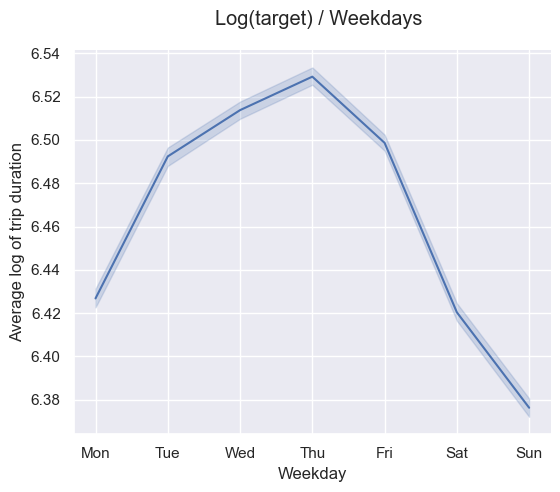

In [19]:
# В зависимости от для недели
g = sns.relplot(x=X_train.weekday, y=y_train, kind='line')

g.set_xlabels('Weekday')
g.set_ylabels('Average log of trip duration')

g.fig.suptitle('Log(target) / Weekdays')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

for ax in g.axes.flat:
    ax.set_xticks([0,1,2,3,4,5,6])
    ax.set_xticklabels(['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

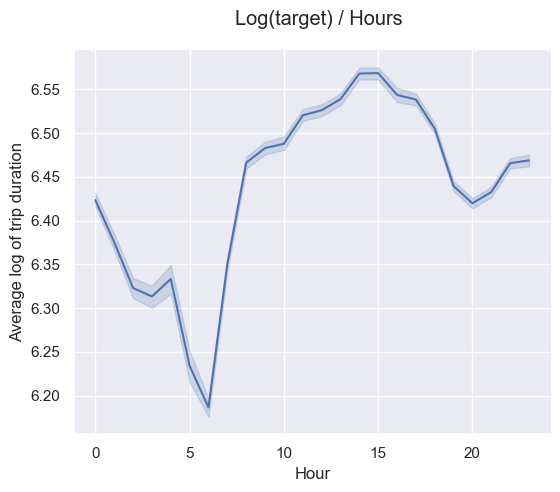

In [20]:
# В зависимости от часа в сутках
g = sns.relplot(x=X_train.hour, y=y_train, kind='line')

g.set_xlabels('Hour')
g.set_ylabels('Average log of trip duration')

g.fig.suptitle('Log(target) / Hours')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

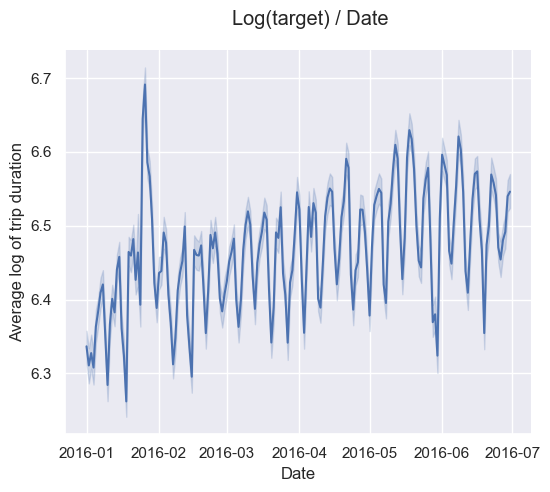

In [21]:
# В зависимости от дня в году
g = sns.relplot(x=X_train.pickup_date, y=y_train, kind='line')

g.set_xlabels('Date')
g.set_ylabels('Average log of trip duration')

g.fig.suptitle('Log(target) / Date')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

    Дополнительно я хочу построить график зависимости от месяца

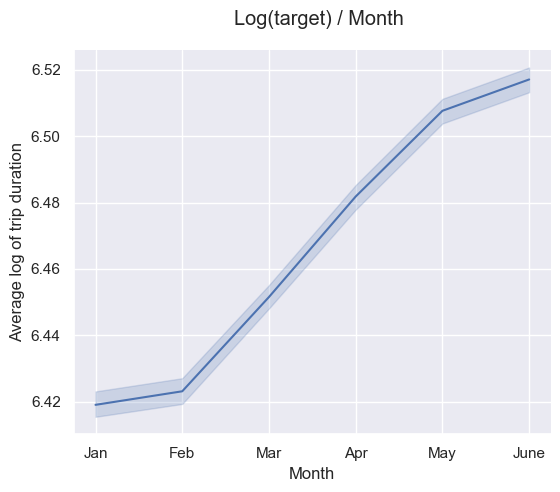

In [22]:
g = sns.relplot(x=X_train.month, y=y_train, kind='line')

g.set_xlabels('Month')
g.set_ylabels('Average log of trip duration')

g.fig.suptitle('Log(target) / Month')

g.fig.subplots_adjust(left = 0.01, top = 0.9)

for ax in g.axes.flat:
    ax.set_xticks([1,2,3,4,5,6])
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'June'])

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

**Ответ**:
+ График зависимости таргета от часа в сутках похож на зависимость числа поездок от часа в сутках. Видимо признак "число поездок" хорошо коррелирует с логарифмом таргета
+ График а зависимости от дня недели не совсем похож. Пик числа поездок приходится на пятницу, в то время как пик длительности поездки приходится на четверг
+ В первый аномальный период длительность поездки сильно возрасла (что логично в снегопад), а во втрой период сильно сократилась. 
+ В целом длительность поездок растет от января к маю, а потом начинает незначительно сокращаться


Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

    Все уже было добавлено ранее. Осталось добавить признаки для аномалий

In [23]:
# Переведем pickup_date в формат datetime
X_train['pickup_date'] = X_train['pickup_date'].astype('datetime64')
X_test['pickup_date'] = X_test['pickup_date'].astype('datetime64')

# create features for two anomalies
X_train['an_1'] = (X_train['pickup_date'] >= '2016-01-23') & (X_train['pickup_date'] <= '2016-01-25')
X_test['an_1'] = (X_test['pickup_date'] >= '2016-01-23') & (X_test['pickup_date'] <= '2016-01-25')
X_test['an_2'] =  (X_test['pickup_date'] >= '2016-05-29') & (X_test['pickup_date'] <= '2016-05-31')
X_train['an_2'] =  (X_train['pickup_date'] >= '2016-05-29') & (X_train['pickup_date'] <= '2016-05-31')

# уберем колоку pickup date
X_train.drop(columns=['pickup_date'], inplace=True)
X_test.drop(columns=['pickup_date'], inplace=True)

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

    **Ответ** Пока что все созданные признаки стоит рассматривать как категориальные. Рассмотрим, например, месяц. Если рассмаотривать его как числовой признак, то коэфициент при этом признаке в регрессии получает следующую интерпретацию: 'увеличение месяца на 1 ведет к увеличению / уменьшению длинны поездки в среднем на $\beta_{month}$', что скорее всего будет неверно, так как зависимость может быть немонотонной. Из всех переменных, только дата и месяц имеют монотонную зависимость с целевой переменной. Поэтому месяц я бы использовал в регрессии как числовую переменную. 

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [24]:
numeric_features_1 = ['month', 'day']
categorical_features_1 = ['hour', 'weekday', 'an_1', 'an_2']

In [25]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error

In [26]:
from sklearn.metrics import r2_score

In [28]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_1),
    ('scaling', StandardScaler(), numeric_features_1)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f'Test RMSE = %.4f' % r2_score(y_test, y_pred))

Test RMSE = 0.0175


    RMSE на константе было 0.7958. Сейчас, 0.7880. Стало лучше, но незначительно. 

## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [29]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [30]:
show_circles_on_map(df.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [31]:
show_circles_on_map(df.sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие две точки выделяются на карте?

**Ответ**: JFK и New Libery Airports (видимость второго зависит от удачности сэмплирования)

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

    Воспользуемся функцией haversine

In [32]:
from haversine import haversine

In [33]:
X_train['pickup'] = list(zip(X_train['pickup_latitude'], X_train['pickup_longitude']))
X_train['dropoff'] = list(zip(X_train['dropoff_latitude'], X_train['dropoff_longitude']))

X_test['pickup'] = list(zip(X_test['pickup_latitude'], X_test['pickup_longitude']))
X_test['dropoff'] = list(zip(X_test['dropoff_latitude'], X_test['dropoff_longitude']))

    Почситаем расстояние и запишем данные в dataset

In [34]:
X_train['haversine'] = X_train.apply(lambda x: haversine(x['pickup'], x['dropoff']), axis=1)
X_test['haversine'] = X_test.apply(lambda x: haversine(x['pickup'], x['dropoff']), axis=1)

Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [35]:
X_train['log_haversine'] = np.log1p(X_train['haversine'])
X_test['log_haversine'] = np.log1p(X_test['haversine'])

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

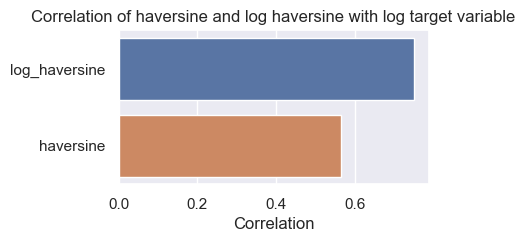

In [36]:
#compute correlation
correlations = X_train[['haversine', 'log_haversine']].corrwith(y_train).sort_values(ascending=False)
#plot correlation
plot = sns.barplot(y=correlations.index, x=correlations)
plot.figure.set_size_inches(4, 2)

plot.set_xlabel('Correlation')
plot.set_title('Correlation of haversine and log haversine with log target variable');

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

In [37]:
X_train['mean_speed'] = X_train['haversine'] / np.expm1(y_train) # calculate mean speed in km/s

In [38]:
X_train['mean_speed_km_h'] = X_train['mean_speed'] * 3600 # calculate mean speed in km/h for better interpretability

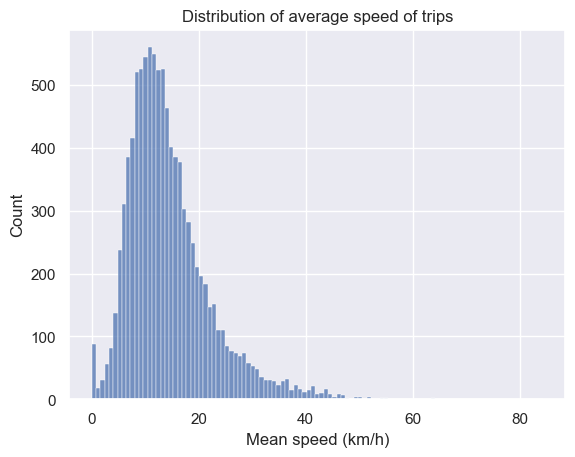

In [39]:
# I use sampling, beacause it takes too much time to plot with the whole training set (the idea is clear even with sampling)
g = sns.histplot(X_train['mean_speed_km_h'].sample(10000))

g.set_title('Distribution of average speed of trips')
g.set_xlabel('Mean speed (km/h)');

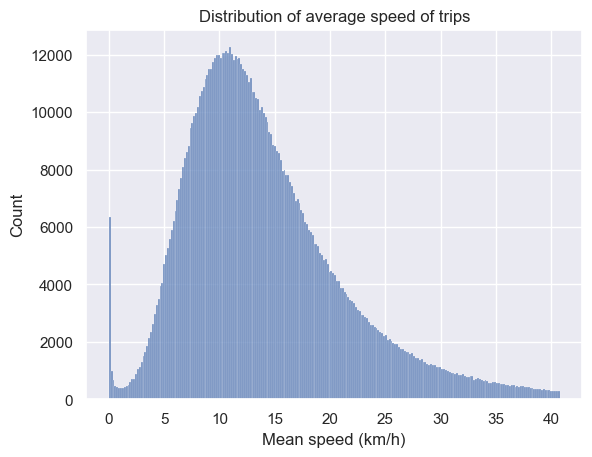

In [40]:
mask_hist = X_train.mean_speed_km_h < X_train.mean_speed_km_h.quantile(0.99)
g = sns.histplot(X_train.mean_speed_km_h[mask_hist])

g.set_title('Distribution of average speed of trips')
g.set_xlabel('Mean speed (km/h)');

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

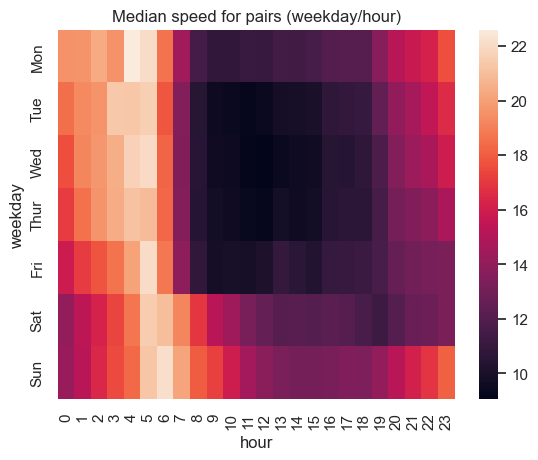

In [41]:
matrix_ = pd.pivot_table(data=X_train[mask_hist], values='mean_speed_km_h', index='weekday', columns='hour', aggfunc=np.median)
matrix_.index = matrix_.index.map(weekdays)
g = sns.heatmap(matrix_)
g.set_title('Median speed for pairs (weekday/hour)');

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

**Ответ**: Потому что скорость была получена по формуле $v = \frac{s}{t}$, в которой учавствует время поездки (target). Нельзя использовать переменные, созданные на основе целевой переменной для предсказания целевой переменной.

In [42]:
X_train.drop(columns='mean_speed', inplace=True)
X_train.drop(columns='mean_speed_km_h', inplace=True)

**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

**Ответ**: Скорость максимальна в ночное время суток (с 4 до 6 утра). Скорость минимальна с 8 до 19 часов с понедельника по пятницу.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

In [43]:
X_train['jam_trip'] = ((7 < X_train['hour']) & (X_train['hour'] < 20)) & ((0 <= X_train['weekday']) & (X_train['weekday']<=4))
X_test['jam_trip'] = ((7 < X_test['hour']) & (X_test['hour'] < 20)) & ((0 <= X_test['weekday']) & (X_test['weekday']<=4))

**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

    Точки были ограничены по 2 координатным осям

In [44]:
#pick_up JFK
X_train['pickup_JFK'] = (
    (X_train['pickup_latitude'] < 40.677) & 
    (X_train['pickup_latitude'] > 40.617) &
    (X_train['pickup_longitude'] < -73.733) &
    (X_train['pickup_longitude'] > -73.833)
)
###
X_test['pickup_JFK'] = (
    (X_test['pickup_latitude'] < 40.677) & 
    (X_test['pickup_latitude'] > 40.617) &
    (X_test['pickup_longitude'] < -73.733) &
    (X_test['pickup_longitude'] > -73.833)
)

#drop_off JFK
X_train['dropoff_JFK'] = (
    (X_train['dropoff_latitude'] < 40.677) & 
    (X_train['dropoff_latitude'] > 40.617) &
    (X_train['dropoff_longitude'] < -73.733) &
    (X_train['dropoff_longitude'] > -73.833)
)
X_test['dropoff_JFK'] = (
    (X_test['dropoff_latitude'] < 40.677) & 
    (X_test['dropoff_latitude'] > 40.617) &
    (X_test['dropoff_longitude'] < -73.73) &
    (X_test['dropoff_longitude'] > -73.83)
)

#-----------------------------------------------------------------------------

#pick_up la Guardia
X_train['pickup_la_guardia'] = (
    (X_train['pickup_latitude'] < 40.79) & 
    (X_train['pickup_latitude'] > 40.76) &
    (X_train['pickup_longitude'] < -73.849) &
    (X_train['pickup_longitude'] > -73.896)
)

X_test['pickup_la_guardia'] = (
    (X_test['pickup_latitude'] < 40.79) & 
    (X_test['pickup_latitude'] > 40.76) &
    (X_test['pickup_longitude'] < -73.849) &
    (X_test['pickup_longitude'] > -73.896)
)

#drop_off la Guardia
X_train['dropoff_la_guardia'] = (
    (X_train['dropoff_latitude'] < 40.79) & 
    (X_train['dropoff_latitude'] > 40.76) &
    (X_train['dropoff_longitude'] < -73.849) &
    (X_train['dropoff_longitude'] > -73.896)
)
X_test['dropoff_la_guardia'] = (
    (X_test['dropoff_latitude'] < 40.79) & 
    (X_test['dropoff_latitude'] > 40.76) &
    (X_test['dropoff_longitude'] < -73.849) &
    (X_test['dropoff_longitude'] > -73.896)
)

    Проверим, что все правильно, построив точки на карте

In [45]:
def show_circles_on_map_simple(data, latitude_column, longitude_column, color):
    """
    A simplies version of the previously defined function
    Used for multiple plotting and checks
    """
    
    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_child(folium.Popup(f'{row[latitude_column]}{row[longitude_column]}')).add_to(m)

    return m

In [46]:
location = (40.711, -73.846)
m = folium.Map(location=location)

show_circles_on_map_simple(X_train[X_train['dropoff_JFK'] == True].sample(1000), "dropoff_latitude", "dropoff_longitude", "blue")
show_circles_on_map_simple(X_train[X_train['pickup_JFK'] == True].sample(1000), "pickup_latitude", "pickup_longitude", "red")
show_circles_on_map_simple(X_train[X_train['dropoff_la_guardia'] == True].sample(1000), "dropoff_latitude", "dropoff_longitude", "orange")
show_circles_on_map_simple(X_train[X_train['pickup_la_guardia'] == True].sample(1000), "pickup_latitude", "pickup_longitude", "black")

In [47]:
X_train[X_train['dropoff_JFK'] == True].shape

(9771, 24)

In [48]:
X_train[X_train['dropoff_la_guardia']].shape

(13039, 24)

    Все сделано правильно

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

<AxesSubplot: xlabel='pickup_la_guardia', ylabel='log_trip_duration'>

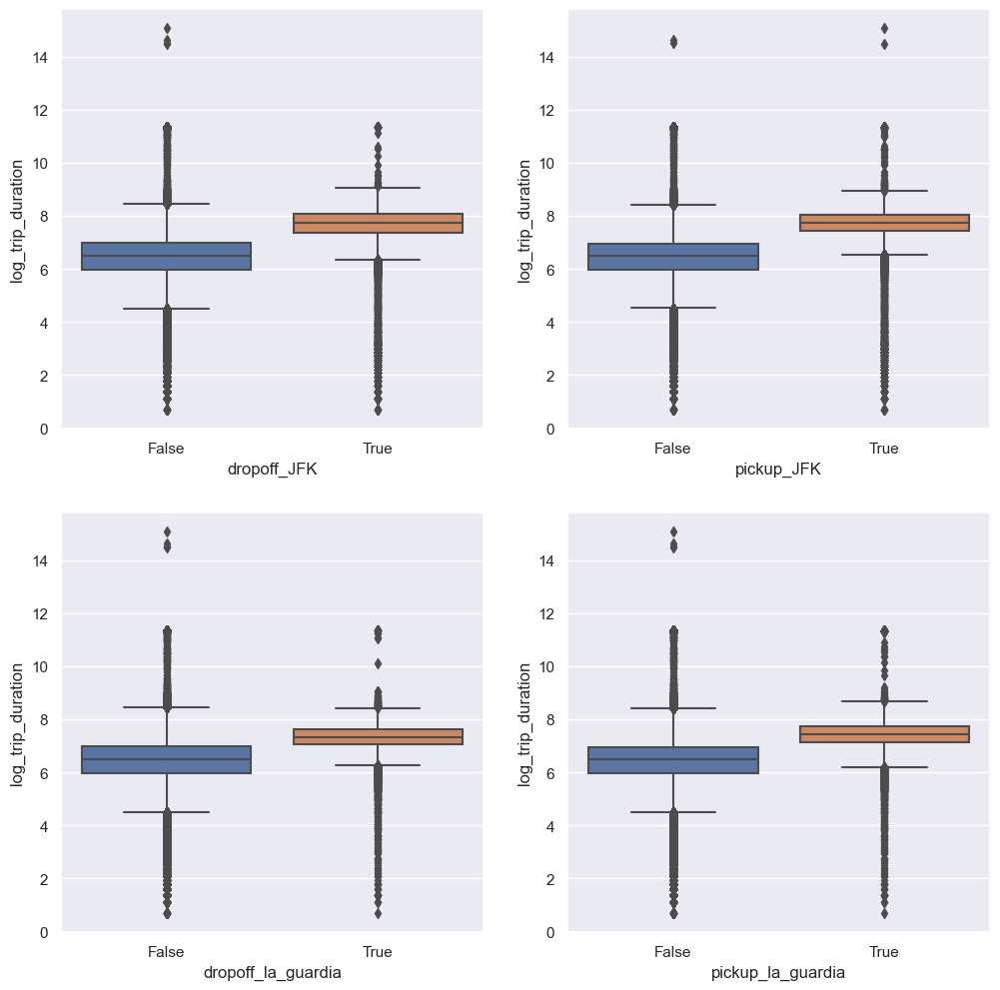

In [49]:
fig, ax = plt.subplots(2,2, figsize=(12,12))

sns.boxplot(x = X_train['dropoff_JFK'], y=y_train, ax=ax[0,0])
sns.boxplot(x = X_train['pickup_JFK'], y=y_train, ax=ax[0,1])
sns.boxplot(x = X_train['dropoff_la_guardia'], y=y_train, ax=ax[1,0])
sns.boxplot(x = X_train['pickup_la_guardia'], y=y_train, ax=ax[1,1])

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

**Ответ**: в целом по графикам видно, что среднее при True / False различается примерно на 1 единицу в логарифмах.
Например, разница между log_trip_duration = 6.5 и log_trip_duration = 7.5 это примерно 1142 секунд разницы. То есть поездки в аэропорт в среднем отличабтся на 19 минут от поездок не в аэропорт.

Значит у нас получились хорошие признаки

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

    Для начала создадим функцию, которая будет отрисовывать прямоугольник, показанный выше на карте.
    Параметры краев сетки подобраны так, чтобы отрисовка максимально походила на картинку выше.
    Так удобнее представлять, что происходит.

In [50]:
#first let us create a function that draws the grid above

def get_grid(X, latitude_column, longitude_column, n_rows = 4, n_cols = 3):
    
    '''
    The function creates a grid of preconfigured dimensions over the region of highest points concentration on the map
    ---------
    Parameters:
    n_rows: int, default = 4
        Sets the number of rows for the grid
    n_cols: int, default = 3
        Sets the number of cols for the grid
    latitude_column: 
        The name of column of the dataset that contains lattitude values
    longitude_column:
        The name of column of the dataset that contains longitude values
    '''
    # create the grid
    # first limit data by quantile
    # Remark: here I make the caluclations such that the final grid resembles the one on the picture above
    # It would be more correct to take 2 or 3 sigmas from mean for the boundaries of the grid
    max_lat, max_lon = X[latitude_column].mean() + 1.5 * X[latitude_column].std(), X[longitude_column].mean() + X[longitude_column].std()
    min_lat, min_lon = X[latitude_column].mean() - 1.5 * X[latitude_column].std(), X[longitude_column].mean() - X[longitude_column].std()
    
    # then caluclate lower left and upper right of the whole grid
    upper_right = [max_lat, max_lon]
    lower_left = [min_lat, min_lon]
    
    # we can simply set the values for the grid without preicise measurements just using coordinates from google earth
    #lower_left = [40.705138, -74.021213]
    #upper_right = [40.797377, -73.934778]
    
    # create a list for future plotting
    all_boxes = []
    
    lat_steps = np.linspace(lower_left[0], upper_right[0],n_rows+1) # поделить долготу по сетке
    lon_steps = np.linspace(lower_left[1], upper_right[1], n_cols+1) # поделить широту по сетке
    
    #длинна одного шага
    lat_stride = lat_steps[1] - lat_steps[0]
    lon_stride = lon_steps[1] - lon_steps[0]
    
    for lat_num, lat in enumerate(lat_steps[:-1]):
        for lon_num, lon in enumerate(lon_steps[:-1]):
            # Define dimensions of box in grid
            upper_left = [lon, lat + lat_stride]
            upper_right = [lon + lon_stride, lat + lat_stride]
            lower_right = [lon + lon_stride, lat]
            lower_left = [lon, lat]

            # Define json coordinates for polygon
            # We repeat upper_left at the end because we draw a ploygon
            coordinates = [
                upper_left,
                upper_right,
                lower_right,
                lower_left,
                upper_left
            ]
                        
            # save the coordinates in geo_json format
            geo_json = {"type": "FeatureCollection",
                        "properties":{
                            "lower_left": lower_left,
                            "upper_right": upper_right
                        },
                        "features":[]}
            
            # add a polygon to our feature collection
            grid_feature = {
                "type":"Feature",
                "geometry":{
                    "type":"Polygon",
                    "coordinates": [coordinates],
                }
            }
            
            geo_json["features"].append(grid_feature)
            
            # put a feature collection in a list of all cells
            all_boxes.append(geo_json)
    #print(all_boxes)
    return all_boxes

In [51]:
m = folium.Map(zoom_start = 12, location=[40.779781, -73.967939])
grid = get_grid(X_train.sample(1000), 'pickup_latitude', 'pickup_longitude')
for i, geo_json in enumerate(grid):

    color = 'blue'

    gj = folium.GeoJson(geo_json,
                        style_function=lambda feature, color=color: {
                                                                        'fillColor': 'blue',
                                                                        'color':"black",
                                                                        'weight': 2,
                                                                        'dashArray': '5, 5',
                                                                        'fillOpacity': 0.55,
                                                                    })

    m.add_child(gj)
m

    Теперь приступим с созданию трансформера, воспользовавшись опытом построения сетки
    Я добавил к каждой функции docstring, чтобы было легче разорбаться при проверке
    
    
    В функции classifier код не очень читаемый, потому что большая читаемость кода требует преобразований средствами языка python, чего я старался избежать. Все основано на вектоных операциях в numpy, которые задействуют лишь код на C. Удалось увеличить скорость трансформации с 5-6 сек до <1 сек

In [52]:
from sklearn.base import BaseEstimator, TransformerMixin

class MapGridTransformer(BaseEstimator, TransformerMixin):
    """Transformer for creating a grid and two column of features
    
    ----------
    Parameters
    n_rows: int, default = 4
        Sets the number of rows for the grid
    n_cols: int, default = 3
        Sets the number of cols for the grid
    """
    def __init__(self, n_rows=4, n_cols=3):
        self.n_rows = n_rows
        self.n_cols = n_cols
        
    def fit(self, X, y=None):
        """
        Creates pickup and dropoff grid for further use
        """
        
        # get the grid
        self.lat_grid, self.lon_grid = self.get_boxes(X, 'pickup_latitude', 'pickup_longitude', self.n_rows, self.n_cols)
        
        
        return self
        
        
    
    def transform(self, X, y=None):
        """
        
        """
        X = X.copy()
        
        
        X['pickup_classified'] = self.classifier(X, 'pickup_latitude', 'pickup_longitude', self.lat_grid, self.lon_grid)
        X['dropoff_classified'] = self.classifier(X, 'dropoff_latitude', 'dropoff_longitude', self.lat_grid, self.lon_grid)

        return X
    
        
    def get_boxes(self, X, latitude_column, longitude_column, n_rows=4, n_cols=3):
        '''
        The function creates longitude and latitude grids for further classification
        Returns separately latitude and longitude grid
    
        -------
        Parameters
        X: DataFrame, given dataset
        latitude_column: str, the name of coumn containing lattitude
        longitude_column: str, the name of column containing longitude
        n_rows: int, number of rows in the grid
        n_cols: int, number of columns in the grid
        '''
        
        #caluclate lower left and upper right of the whole grid based on the given data (tuned so that it fits the image above)
        max_lat, max_lon = X[latitude_column].mean() + 1.5 * X[latitude_column].std(), X[longitude_column].mean() + X[longitude_column].std()
        min_lat, min_lon = X[latitude_column].mean() - 1.5 * X[latitude_column].std(), X[longitude_column].mean() - X[longitude_column].std()
        upper_right = [max_lat, max_lon]
        lower_left = [min_lat, min_lon]
        
        lat_grid = np.linspace(lower_left[0], upper_right[0],n_rows+1) # create a grid for latitude (need 5 steps for 4 rows)
        lon_grid = np.linspace(lower_left[1], upper_right[1], n_cols+1) # create a grid for longitude (need 4 steps for 3 rows)
        
        return lat_grid, lon_grid
    
            
    
    def classifier(self, X, lat_column, lon_column, lat_grid, lon_grid):
        """
        Classifier 
        
        ---------
        Parameters:
        X: Dataframe
        lat_column: column of the dataframe containing latitude values
        lon_column: column of dataframe containing longitude values
        lat_grid: grid of latitude values
        lon_grid: grid of longitude values
        """
        
        # sort the values
        x = np.searchsorted(a = lat_grid, v = X[lat_column], side='right')
        y = np.searchsorted(a = lon_grid, v = X[lon_column], side='right')
        
        # create the mask for elements within the grid (all elements outside of the grid are marked with False)
        mask = (x != 0) & (x <= self.n_rows) & (y != 0) & (y <= self.n_cols)
        
        # apply fancy transforamtions and mask
        result = ((1 + (self.n_cols * (x - 1)) + y) - 1) * mask
        result[result == 0] = -1
                        
        return result

    Проверим, правильно ли мы провели классификацию

In [53]:
transformer = MapGridTransformer()

In [54]:
just_testing = transformer.fit_transform(X_train)

In [55]:
just_testing['dropoff_classified'].unique()

array([ 8, 11, -1,  5,  1, 12,  7,  9,  4,  2,  3,  6, 10])

    Получилось 13 классов, как и должно было
    Отобразим наши классы на карте разными цветами вместе с сеткой

In [56]:
m = folium.Map(zoom_start = 12, location=[40.779781, -73.967939])
grid = get_grid(just_testing, 'pickup_latitude', 'pickup_longitude')
for i, geo_json in enumerate(grid):

    color = 'blue'

    gj = folium.GeoJson(geo_json,
                        style_function=lambda feature, color=color: {
                                                                        'fillColor': 'blue',
                                                                        'color':"black",
                                                                        'weight': 2,
                                                                        'dashArray': '5, 5',
                                                                        'fillOpacity': 0.55,
                                                                    })

    m.add_child(gj)

colors = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6','#6a3d9a','#ffff99','#b15928']

show_circles_on_map_simple(just_testing[just_testing['dropoff_classified'] == -1].sample(100), "dropoff_latitude", "dropoff_longitude", 'black')

for i in range(1, 13):
    show_circles_on_map_simple(just_testing[just_testing['dropoff_classified'] == i].sample(100, replace=True), "dropoff_latitude", "dropoff_longitude", colors[i-1])
m

    Как видим, классификация прошла успешно. Классы не пересекаются и не выходят за границы сетки

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [57]:
X_train

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,hour,...,an_2,pickup,dropoff,haversine,log_haversine,jam_trip,pickup_JFK,dropoff_JFK,pickup_la_guardia,dropoff_la_guardia
1011257,id2209155,2,2016-05-03 09:03:08,2,-73.979813,40.752529,-73.982681,40.763680,N,9,...,False,"(40.75252914428711, -73.9798126220703)","(40.76367950439453, -73.98268127441406)",1.263189,0.816775,True,False,False,False,False
178550,id0586605,1,2016-01-01 16:40:51,1,-73.977623,40.746296,-73.968414,40.788933,N,16,...,False,"(40.74629592895508, -73.97762298583984)","(40.78893280029297, -73.96841430664062)",4.804019,1.758551,True,False,False,False,False
551460,id0467144,1,2016-04-24 13:57:03,1,-73.950699,40.779404,-73.863129,40.768608,N,13,...,False,"(40.77940368652344, -73.95069885253906)","(40.76860809326172, -73.86312866210938)",7.471099,2.136660,False,False,False,False,True
1434271,id0989010,2,2016-01-10 17:03:47,1,-73.984558,40.721802,-73.976753,40.752213,N,17,...,False,"(40.7218017578125, -73.98455810546875)","(40.75221252441406, -73.97675323486328)",3.444874,1.491751,False,False,False,False,False
1173610,id0580742,1,2016-02-25 17:37:36,1,-73.967720,40.768742,-73.977173,40.789875,N,17,...,False,"(40.768741607666016, -73.96772003173827)","(40.78987503051758, -73.9771728515625)",2.481066,1.247339,True,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259178,id1753868,2,2016-03-25 07:11:49,2,-73.955032,40.777328,-74.006203,40.749424,N,7,...,False,"(40.77732849121094, -73.95503234863281)","(40.74942398071289, -74.0062026977539)",5.310391,1.842198,False,False,False,False,False
1414414,id2204747,1,2016-02-16 18:01:45,1,-73.973618,40.763920,-73.983849,40.749874,N,18,...,False,"(40.763919830322266, -73.97361755371094)","(40.74987411499024, -73.98384857177734)",1.783780,1.023810,True,False,False,False,False
131932,id3043606,2,2016-01-26 19:22:29,1,-74.006195,40.734283,-73.949608,40.785282,N,19,...,False,"(40.734283447265625, -74.00619506835938)","(40.785282135009766, -73.9496078491211)",7.407656,2.129143,True,False,False,False,False
671155,id1458584,1,2016-01-19 11:53:47,1,-73.962341,40.767323,-73.969757,40.768669,N,11,...,False,"(40.7673225402832, -73.96234130859375)","(40.76866912841797, -73.96975708007811)",0.642216,0.496047,True,False,False,False,False


In [58]:
numeric_features_2 = ['month', 'log_haversine', 'day']
categorical_features_2 = ['hour', 'weekday', 'an_1', 'an_2', 'jam_trip',
                          'pickup_JFK', 'dropoff_JFK', 'pickup_la_guardia', 'dropoff_la_guardia', 'pickup_classified', 'dropoff_classified']

In [59]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_2),
    ('scaling', StandardScaler(), numeric_features_2)
])

pipeline = Pipeline(steps=[
    ('feature_creation', MapGridTransformer()),
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f'Test RMSE = %.4f' % r2_score(y_test, y_pred))

Test RMSE = 0.6414


    Было 0.7880, стало 0.4761. Качество предсказаний повысилось

     На всякий случай, проверим, правильно лм мы встроили трансформер в pipeline
     Все ли признаки используются Ridge регрессией? 

In [58]:
print(list(pipeline.named_steps.ohe_and_scaling.get_feature_names_out()))

['ohe__hour_0', 'ohe__hour_1', 'ohe__hour_2', 'ohe__hour_3', 'ohe__hour_4', 'ohe__hour_5', 'ohe__hour_6', 'ohe__hour_7', 'ohe__hour_8', 'ohe__hour_9', 'ohe__hour_10', 'ohe__hour_11', 'ohe__hour_12', 'ohe__hour_13', 'ohe__hour_14', 'ohe__hour_15', 'ohe__hour_16', 'ohe__hour_17', 'ohe__hour_18', 'ohe__hour_19', 'ohe__hour_20', 'ohe__hour_21', 'ohe__hour_22', 'ohe__hour_23', 'ohe__weekday_0', 'ohe__weekday_1', 'ohe__weekday_2', 'ohe__weekday_3', 'ohe__weekday_4', 'ohe__weekday_5', 'ohe__weekday_6', 'ohe__an_1_False', 'ohe__an_1_True', 'ohe__an_2_False', 'ohe__an_2_True', 'ohe__jam_trip_False', 'ohe__jam_trip_True', 'ohe__pickup_JFK_False', 'ohe__pickup_JFK_True', 'ohe__dropoff_JFK_False', 'ohe__dropoff_JFK_True', 'ohe__pickup_la_guardia_False', 'ohe__pickup_la_guardia_True', 'ohe__dropoff_la_guardia_False', 'ohe__dropoff_la_guardia_True', 'ohe__pickup_classified_-1', 'ohe__pickup_classified_1', 'ohe__pickup_classified_2', 'ohe__pickup_classified_3', 'ohe__pickup_classified_4', 'ohe__picku

    Как видим все признаки были задействованы

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

**Ответ**: 

`vendor_id` может быть полезным, потому что водители определенных операторов такси могут в среднем выполнять заказы бытрее / медреннее. Это можно увидеть, построив boxplot.

`passenger_count` может быть полезным, потому что поездки с большим числом пассажиров могут занимать больше времени, так как некоторые пассажиры могут выходить по пути. 

`store_and_fwd_flag` может быть полезным, так как машины, которые находятся offline могут начинать свои поездки далеко от центра города (поэтому у них нет соединения с системой)


Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [59]:
print(f'vendor_id has {X_train.vendor_id.nunique()} counts')
print(f'passenger_count has {X_train.passenger_count.nunique()} counts')
print(f'store_and_fwd_flag has {X_train.store_and_fwd_flag.nunique()} counts')

vendor_id has 2 counts
passenger_count has 10 counts
store_and_fwd_flag has 2 counts


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

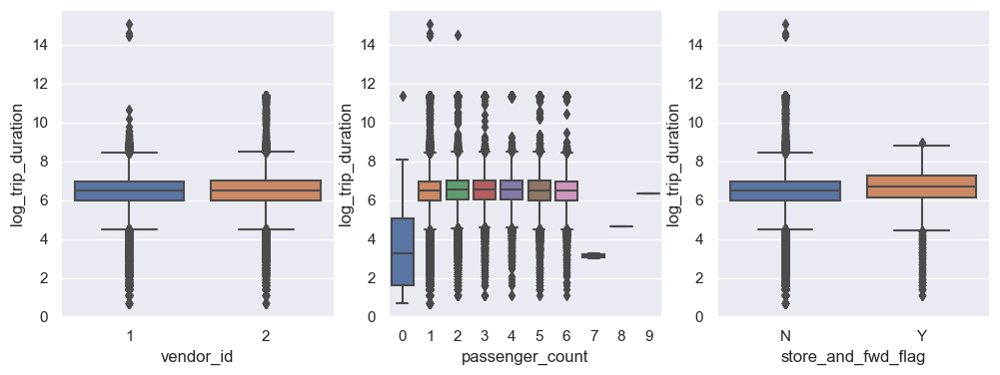

In [60]:
fig, ax = plt.subplots(1,3, figsize=(12,4))

sns.boxplot(x=X_train['vendor_id'], y=y, ax=ax[0], )
sns.boxplot(x=X_train['passenger_count'], y=y, ax=ax[1])
sns.boxplot(x=X_train['store_and_fwd_flag'], y=y, ax=ax[2]);

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [61]:
# for train set
X_train.vendor_id = df.vendor_id.map({1: 0,
                                 2: 1})
X_train.store_and_fwd_flag = df.store_and_fwd_flag.map({'N': 0,
                                                   'Y': 1})

# for test set
X_test.vendor_id = df.vendor_id.map({1: 0,
                                 2: 1})
X_test.store_and_fwd_flag = df.store_and_fwd_flag.map({'N': 0,
                                                   'Y': 1})

**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

**Ответ**: 
+ Я думаю, что это признаки не будут сильными, так как средние значения логарифмов времени поездки почти не отличаются между группами для `vendor_id` и `store_and_fwd_flag`. 
+ У `store_and_fwd_flag` различия немного более выраженные, к тому же для значений с меткой `Y` почти нет наблдюдений больше верхней границы интерквартального размаха.
+ С `passenger_count` ситуация немного другая. Для значений с 1 до 6 различия незначительные. А вот для значечения 0 время поездки намного меньше. Учитывая, что в тренировочном датасете у нас всего 41 такое наблюдение, скорее всего это ошибочно зарегестрированные поездки. Для этого признака значения с 1 по 6 я бы сгруппировал.

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [62]:
numeric_features_3 = ['month', 'log_haversine', 'day']
categorical_features_3 = [
    'hour', 'weekday', 'an_1', 'an_2', 'jam_trip',
    'pickup_JFK', 'dropoff_JFK', 'pickup_la_guardia', 'dropoff_la_guardia', 'pickup_classified', 'dropoff_classified',
    'store_and_fwd_flag', 'vendor_id', 'passenger_count'
                         ]

In [63]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_3),
    ('scaling', StandardScaler(), numeric_features_3)
])

pipeline = Pipeline(steps=[
    ('feature_creation', MapGridTransformer()),
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_train)
y_pred = model.predict(X_test)
print(f'Test RMSE = %.4f' % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.4757


     Было 0.4761, стало 0.4757. Улучшение на 0.0004 несущественно => признаки можно выкинуть (но я все равно оставляю)

Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

    Для начала поработаем с остатсками регрессии

In [64]:
y_pred_train = model.predict(X_train)

    У нас есть пары y_test и y_pred; y_train и y_pred_train
    С помощью них можно посчитать residuals на тестовой и тренировочной выборках

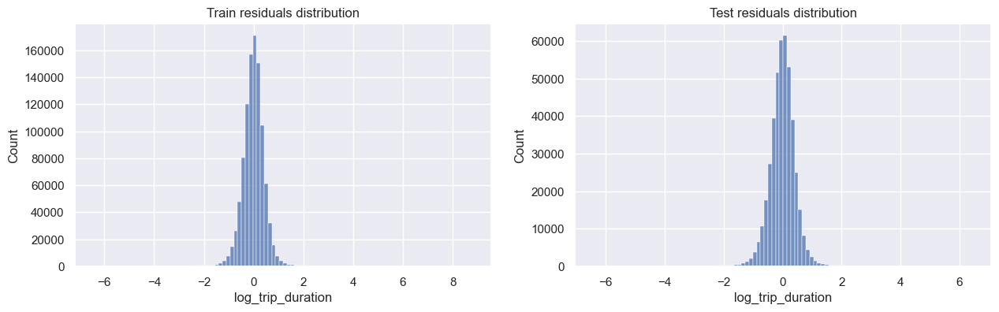

In [65]:
fig, ax = plt.subplots(1,2, figsize=(15,4))

train_residuals = y_train - y_pred_train
test_residuals = y_test - y_pred
sns.histplot(train_residuals, bins=100, ax=ax[0])
sns.histplot(test_residuals, bins=100, ax=ax[1])

ax[0].set_title('Train residuals distribution')
ax[1].set_title('Test residuals distribution');

    Отсечем наблюдения по квантилю так, чтобы это было согласованно с наблюдением на графике и имело смысл.

In [66]:
mask_residuals = (train_residuals > train_residuals.quantile(0.004)) & (train_residuals < train_residuals.quantile(0.998))

X_train_clear = X_train[mask_residuals]
y_train_clear = y_train[mask_residuals]

    Теперь поработаем с пройденным расстоянием

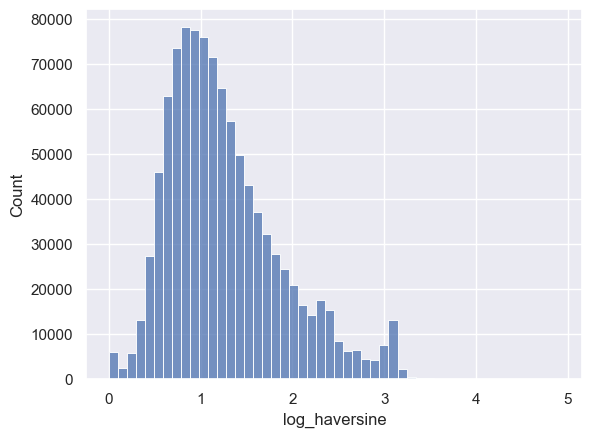

In [67]:
sns.histplot(X_train_clear.log_haversine, bins=50);

    Здесь разумным будет выкинуть объекты больше 3

In [68]:
mask_distance = (X_train_clear.log_haversine < X_train_clear.log_haversine.quantile(0.999))

X_train_clear = X_train_clear[mask_distance]
y_train_clear = y_train_clear[mask_distance]

    Теперь поработаем с временем поездки

<AxesSubplot: xlabel='log_trip_duration', ylabel='Count'>

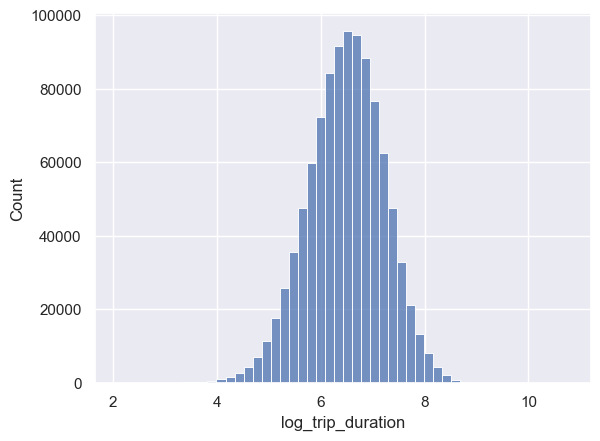

In [69]:
sns.histplot(y_train_clear, bins=50)

    Уберем данные из DataFrame по квантилям

In [70]:
mask_duration = (y_train_clear > y_train_clear.quantile(0.002)) & (y_train_clear < y_train_clear.quantile(0.999))

X_train_clear = X_train_clear[mask_duration]
y_train_clear = y_train_clear[mask_duration]

Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

    Сначала посмотрим на распределения категориальных переменных, чтобы понять, какие категории у нас редкие
    В категориальных переменных у нас есть распределение по сетке, но в самом DataFrame его нет, так как его добвлят Transformer
    Для построения распределений добавим эту категориальную переменную

In [71]:
transformer = MapGridTransformer()
X_train_clear = transformer.fit_transform(X_train_clear)

    Теперь построим распределения

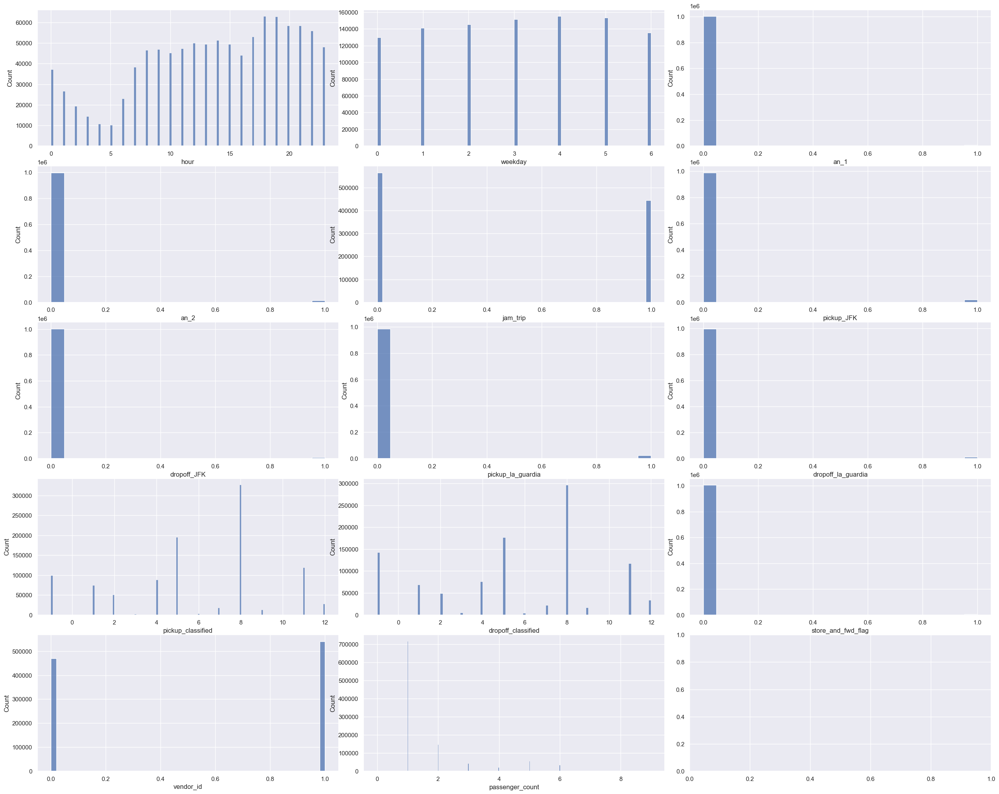

In [72]:
fig, ax = plt.subplots(5,3, figsize=(25,20))
fig.tight_layout()

for ax, col in zip(ax.flatten(), categorical_features_3):
    #ax.set_title(col)
    sns.histplot(X_train_clear[col], ax=ax)

     Как вы видим редкие категории содержатся в переменных:
     + pickup_classified
     + dropoff_classified
     + passenger_count
     
     В pickup classified / dropoff classified редкими являются классы 3, 6, 10, которые относятся к районам Queens, Brooklyn и North Bergen
     Думаю, что стоит создать, что эти классы можно объединить в 1
     Туда бы я также добавил классы 7, 9, 12
     В passenger count редким является все больше 2х, а также ноль. Объединим в одну категорию (это всего 14000 наблюдений их 1000000 всего)

In [73]:
class MyTransformer(BaseEstimator, TransformerMixin):
    """
    This transformer just combines the classes of categorical varibales
    """
    
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        
        X = X.copy()
        # join passenger count categories
        X.loc[(X['passenger_count'] > 2) | (X['passenger_count'] == 0), 'passenger_count'] = 0
        # join pickup_classified categories
        X.loc[X['pickup_classified'].isin([3,6,10,7,9,12]), 'pickup_classified'] = 0
        # join dropoff classified categories
        X.loc[X['dropoff_classified'].isin([3,6,10,7,9,12]), 'dropoff_classified'] = 0
        
        return X

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [74]:
numeric_features_4 = ['month', 'log_haversine', 'day']
categorical_features_4 = [
    'hour', 'weekday', 'an_1', 'an_2', 'jam_trip',
    'pickup_JFK', 'dropoff_JFK', 'pickup_la_guardia', 'dropoff_la_guardia', 'pickup_classified', 'dropoff_classified',
    'store_and_fwd_flag', 'vendor_id', 'passenger_count'
                         ]

In [75]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_4),
    ('scaling', StandardScaler(), numeric_features_4)
])

pipeline = Pipeline(steps=[
    ('feature_creation', MapGridTransformer()),
    ('classes_join', MyTransformer()),
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train_clear, y_train_clear)
y_pred = model.predict(X_test)
print(f'Test RMSE = %.4f' % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.4772


    Было 0.4757, стало 0.4772. Наша модель ухудшилась от преобразований.


**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [76]:
print(f"Number of feature before ohe is {pipeline.named_steps.ohe_and_scaling.n_features_in_}")
print(f"Number of feature after ohe is {pipeline.named_steps.regression.n_features_in_}")

Number of feature before ohe is 26
Number of feature after ohe is 71


Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [77]:
from sklearn.linear_model import Lasso

In [78]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_4),
    ('scaling', StandardScaler(), numeric_features_4)
])

pipeline = Pipeline(steps=[
    ('feature_creation', MapGridTransformer()),
    ('classes_join', MyTransformer()),
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

model = pipeline.fit(X_train_clear, y_train_clear)
y_pred = model.predict(X_test)
print(f'Test RMSE = %.4f' % mean_squared_error(y_test, y_pred, squared=False))

Test RMSE = 0.7951


    Lasso регрессия со стандартными параметрами показала значительно более плохой результат, потому что она занулила все параметры

In [79]:
np.count_nonzero(pipeline.named_steps.regression.coef_)

0

Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [80]:
X_train_new, X_val_new, y_train_new, y_val_new = train_test_split(X_train_clear, y_train_clear, test_size=0.2, random_state=42)

In [81]:
alphas = np.logspace(-4, 3, 10)

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

    Для начала сделаем для Lasso

In [82]:
params_Lasso = pd.DataFrame(columns=['C','RMSE','Zeros'])

for alpha in alphas:
    column_transformer = ColumnTransformer([
        ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_4),
        ('scaling', StandardScaler(), numeric_features_4)
    ])

    pipeline = Pipeline(steps=[
        ('feature_creation', MapGridTransformer()),
        ('classes_join', MyTransformer()),
        ('ohe_and_scaling', column_transformer),
        ('regression', Lasso(alpha=alpha))
    ])

    model = pipeline.fit(X_train_clear, y_train_clear)
    y_pred = model.predict(X_val_new)
    print(f'Alpha = {alpha} Validation RMSE = %.4f' % mean_squared_error(y_val_new, y_pred, squared=False))
    temp = pd.DataFrame({'C': alpha,
                        'RMSE': mean_squared_error(y_val_new, y_pred, squared=False),
                        'Zeros': pipeline.named_steps.regression.n_features_in_ - np.count_nonzero(pipeline.named_steps.regression.coef_)}, index=[alpha])
    params_Lasso = params_Lasso.append(temp)

Alpha = 0.0001 Validation RMSE = 0.4017
Alpha = 0.0005994842503189409 Validation RMSE = 0.4025
Alpha = 0.003593813663804626 Validation RMSE = 0.4140
Alpha = 0.021544346900318846 Validation RMSE = 0.4342
Alpha = 0.1291549665014884 Validation RMSE = 0.4710
Alpha = 0.774263682681127 Validation RMSE = 0.7225
Alpha = 4.641588833612782 Validation RMSE = 0.7225
Alpha = 27.825594022071257 Validation RMSE = 0.7225
Alpha = 166.81005372000593 Validation RMSE = 0.7225
Alpha = 1000.0 Validation RMSE = 0.7225


In [83]:
params_Lasso

,C,RMSE,Zeros
0.000100,0.000100,0.401723,11
0.000599,0.000599,0.402464,16
0.003594,0.003594,0.413991,50
0.021544,0.021544,0.434157,66
0.129155,0.129155,0.470978,70
0.774264,0.774264,0.722474,71
4.641589,4.641589,0.722474,71
27.825594,27.825594,0.722474,71
166.810054,166.810054,0.722474,71
1000.000000,1000.000000,0.722474,71


    Как видо лучшая RMSE при aplha = 0.0001
    Построим график нулевых параметров в зависимотси от alpha

<AxesSubplot: xlabel='C', ylabel='Zeros'>

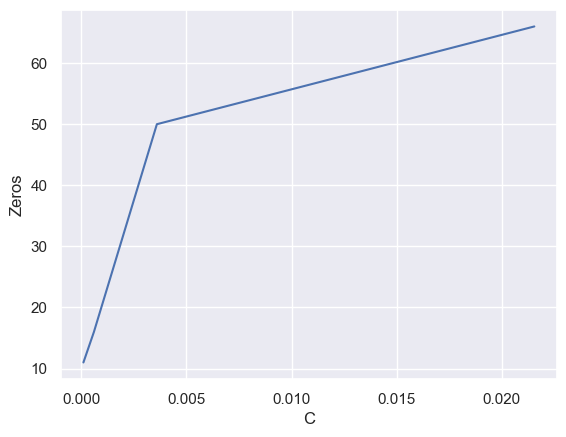

In [85]:
sns.lineplot(data=params_Lasso.iloc[:4], x='C', y='Zeros');

    Уже после первых четверех параметров почти все параметры зануляются
    От половины признаков мы избавляемся при alpha между 0.000599 и 0.003594. При этом RMSE = 0.42
    Если считать, насколько мы теряем в качестве относительно модели с оптимальным параметром alpha, то потеря примерно в 0.02

    Обучим модель с наилучшими параметрами на X_train_clear, y_train_clear. Качество предскажем на X_test, y_test

In [86]:
best_Lasso_params = {'regression__alpha': 0.000100}
model.set_params(**best_Lasso_params)

Pipeline(steps=[('feature_creation', MapGridTransformer()),
                ('classes_join', MyTransformer()),
                ('ohe_and_scaling',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['hour', 'weekday', 'an_1',
                                                   'an_2', 'jam_trip',
                                                   'pickup_JFK', 'dropoff_JFK',
                                                   'pickup_la_guardia',
                                                   'dropoff_la_guardia',
                                                   'pickup_classified',
                                                   'dropoff_classified',
                                                   'store_and_fwd_flag',
                                                   'vendor_id',
                                                   'passenger_count']),
                                                 ('scaling', StandardScaler(),
                                                  ['month', 'log_haversine',
                                                   'day'])])),
                ('regression', Lasso(alpha=0.0001))])

In [87]:
model.fit(X_train_clear, y_train_clear)
y_pred = model.predict(X_test)
print(f'Test RMSE for Lasso with best parameter is {mean_squared_error(y_test, y_pred, squared=False)}')

Test RMSE for Lasso with best parameter is 0.47733789660162157


    Видим, что RMSE для Lasso c наилучшим параметром лучше, чем с дефолтным.
    RMSE почти не отличается от RMSE для Ridge с дефолтными параметрами. Видимо это потому что занулилось не так много весов.

    Теперь сделаем то же самое для Ridge

In [88]:
params_Ridge = pd.DataFrame(columns=['C','RMSE'])

for alpha in alphas:
    column_transformer = ColumnTransformer([
        ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_4),
        ('scaling', StandardScaler(), numeric_features_4)
    ])

    pipeline = Pipeline(steps=[
        ('feature_creation', MapGridTransformer()),
        ('classes_join', MyTransformer()),
        ('ohe_and_scaling', column_transformer),
        ('regression', Ridge(alpha=alpha))
    ])

    model = pipeline.fit(X_train_clear, y_train_clear)
    y_pred = model.predict(X_val_new)
    print(f'Alpha = {alpha} Validation RMSE = %.4f' % mean_squared_error(y_val_new, y_pred, squared=False))
    temp = pd.DataFrame({'C': alpha,
                        'RMSE': mean_squared_error(y_val_new, y_pred, squared=False)}, index=[alpha])
    params_Ridge = params_Ridge.append(temp)

Alpha = 0.0001 Validation RMSE = 0.4017
Alpha = 0.0005994842503189409 Validation RMSE = 0.4017
Alpha = 0.003593813663804626 Validation RMSE = 0.4017
Alpha = 0.021544346900318846 Validation RMSE = 0.4017
Alpha = 0.1291549665014884 Validation RMSE = 0.4017
Alpha = 0.774263682681127 Validation RMSE = 0.4017
Alpha = 4.641588833612782 Validation RMSE = 0.4017
Alpha = 27.825594022071257 Validation RMSE = 0.4017
Alpha = 166.81005372000593 Validation RMSE = 0.4017
Alpha = 1000.0 Validation RMSE = 0.4018


In [89]:
params_Ridge

,C,RMSE
0.000100,0.000100,0.401714
0.000599,0.000599,0.401714
0.003594,0.003594,0.401714
0.021544,0.021544,0.401714
0.129155,0.129155,0.401714
0.774264,0.774264,0.401714
4.641589,4.641589,0.401714
27.825594,27.825594,0.401714
166.810054,166.810054,0.401716
1000.000000,1000.000000,0.401762


    Как мы видим, у Ridge регрессии нет таких сильных флуктуаций RMSE. Выберем наименьшей параметр в качетве лучшего.

In [90]:
best_Ridge_params = {'regression__alpha': 0.000100}
model.set_params(**best_Ridge_params)

Pipeline(steps=[('feature_creation', MapGridTransformer()),
                ('classes_join', MyTransformer()),
                ('ohe_and_scaling',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(handle_unknown='ignore'),
                                                  ['hour', 'weekday', 'an_1',
                                                   'an_2', 'jam_trip',
                                                   'pickup_JFK', 'dropoff_JFK',
                                                   'pickup_la_guardia',
                                                   'dropoff_la_guardia',
                                                   'pickup_classified',
                                                   'dropoff_classified',
                                                   'store_and_fwd_flag',
                                                   'vendor_id',
                                                   'passenger_count']),
                                                 ('scaling', StandardScaler(),
                                                  ['month', 'log_haversine',
                                                   'day'])])),
                ('regression', Ridge(alpha=0.0001))])

In [91]:
model.fit(X_train_clear, y_train_clear)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train_clear)
print(f'Train RMSE for Ridge with best parameter is {mean_squared_error(y_train_clear, y_pred_train, squared=False)}')
print(f'Test RMSE for Ridge with best parameter is {mean_squared_error(y_test, y_pred, squared=False)}')

Train RMSE for Ridge with best parameter is 0.4023894710623218
Test RMSE for Ridge with best parameter is 0.47721822413245907


    Как видим Test RMSE примерно такое же как было до этого. Это объясняеться тем, что оптимальный параметр регуляризации крайне мал. Мы учим модель почти что без регуляризации.

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

**Ответ**: 

In [92]:
TransformerMixin

sklearn.base.TransformerMixin

In [93]:
class MyTransformer2(BaseEstimator, TransformerMixin):
    '''
    This class simply adds new feature (needed so as to incorporate it into the pipeline)
    '''
    
    def __init__(self):
        pass
    
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        X = X.copy()
        most_common_pairs = list(zip(X.groupby(['pickup_classified', 'dropoff_classified'],
                      as_index=False).count().sort_values(by='id', ascending=False)['pickup_classified'][:100],
                             X.groupby(['pickup_classified', 'dropoff_classified'],
                      as_index=False).count().sort_values(by='id', ascending=False)['dropoff_classified'][:100]))
        # create a mapping for further use
        mapping = dict(zip(most_common_pairs, np.arange(len(most_common_pairs))))
        # create new column
        X['new_feature'] = list(map(lambda x: mapping.get(x),
                                           list(zip(X['pickup_classified'], X['dropoff_classified']))))
        # fill NA with -1 (all other categories)
        X.new_feature.fillna(-1, inplace=True)
        
        return X

Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [94]:
numeric_features_5 = ['month', 'log_haversine', 'day']
categorical_features_5 = [
    'hour', 'weekday', 'an_1', 'an_2', 'jam_trip',
    'pickup_JFK', 'dropoff_JFK', 'pickup_la_guardia', 'dropoff_la_guardia', 'pickup_classified', 'dropoff_classified',
    'store_and_fwd_flag', 'vendor_id', 'passenger_count',
    'new_feature']

    Обучим Ridge регрессию, потому что учится он быстрее, а дает примерно такие же результаты

In [95]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown='ignore'), categorical_features_5),
    ('scaling', StandardScaler(), numeric_features_5)
])

pipeline = Pipeline(steps=[
    ('feature_creation', MapGridTransformer()),
    ('classes_join', MyTransformer()),
    ('add_new_feature', MyTransformer2()),
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(alpha=0.000100))
])

model = pipeline.fit(X_train_clear, y_train_clear)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train_clear)
print(f'Train RMSE = %.4f' % mean_squared_error(y_train_clear, y_pred_train, squared=False))
print(f'Test RMSE = %.4f' % mean_squared_error(y_test, y_pred, squared=False))

Train RMSE = 0.3976
Test RMSE = 0.4777


    Странно, но Test RMSE для Ridge регрессии даже вырасло. А вот train наоборот упало. Возможно модель переобучилась с новыми категориальными переменными.